<a href="https://colab.research.google.com/github/Rajarathour17/AI-Driven-Archeaological-Site-Mapping/blob/main/Training_Scratch%26Pretrained_model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!nvidia-smi

Tue Sep 30 10:58:14 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   58C    P8             12W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 58.2 MB/s eta 0:00:00


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import ultralytics
ultralytics.checks()


Ultralytics 8.3.203 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 39.3/112.6 GB disk)


In [ ]:
ROOT_DIR = '/content/drive/My Drive/vegetation_segmentation'

In [ ]:
!yolo task=detect mode=train model=yolov8m.pt data={"/content/drive/MyDrive/vegetation_segmentation/data.yaml"} epochs=50 imgsz=640

Ultralytics 8.3.203 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/vegetation_segmentation/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8m.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspec

In [ ]:
!ls '/content/runs/detect/train'

args.yaml			 results.csv	      val_batch0_labels.jpg
BoxF1_curve.png			 results.png	      val_batch0_pred.jpg
BoxP_curve.png			 train_batch0.jpg     val_batch1_labels.jpg
BoxPR_curve.png			 train_batch1.jpg     val_batch1_pred.jpg
BoxR_curve.png			 train_batch2360.jpg  val_batch2_labels.jpg
confusion_matrix_normalized.png  train_batch2361.jpg  val_batch2_pred.jpg
confusion_matrix.png		 train_batch2362.jpg  weights
labels.jpg			 train_batch2.jpg


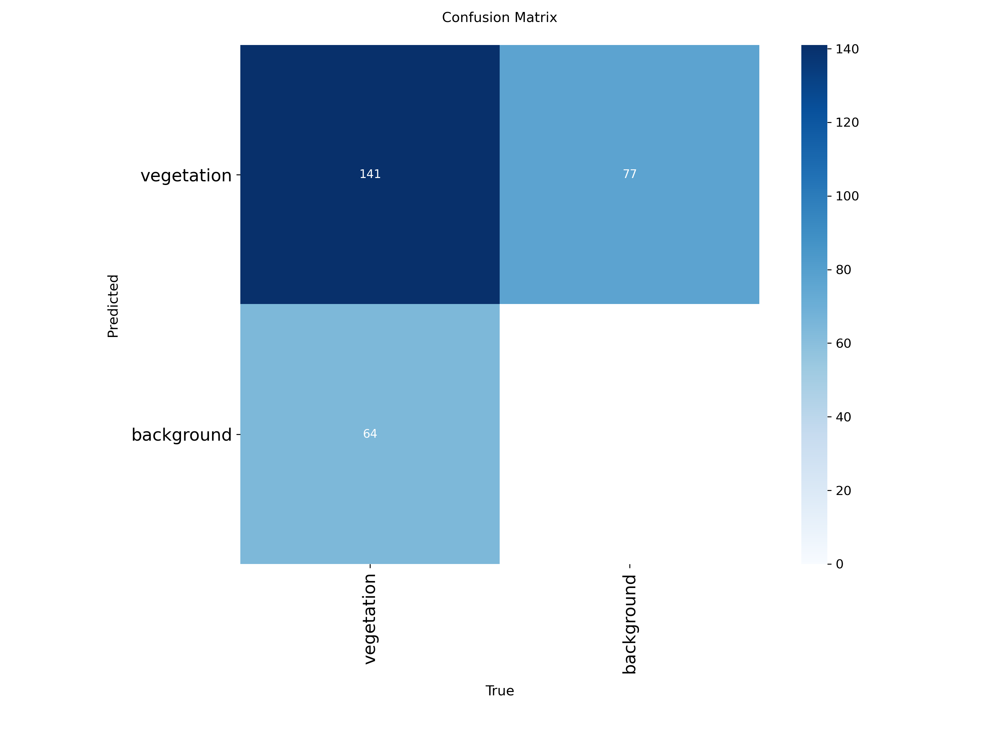

In [ ]:
resultData = '/content/runs/detect/train'
from IPython.display import Image, display

Image(filename=f'{resultData}/confusion_matrix.png')

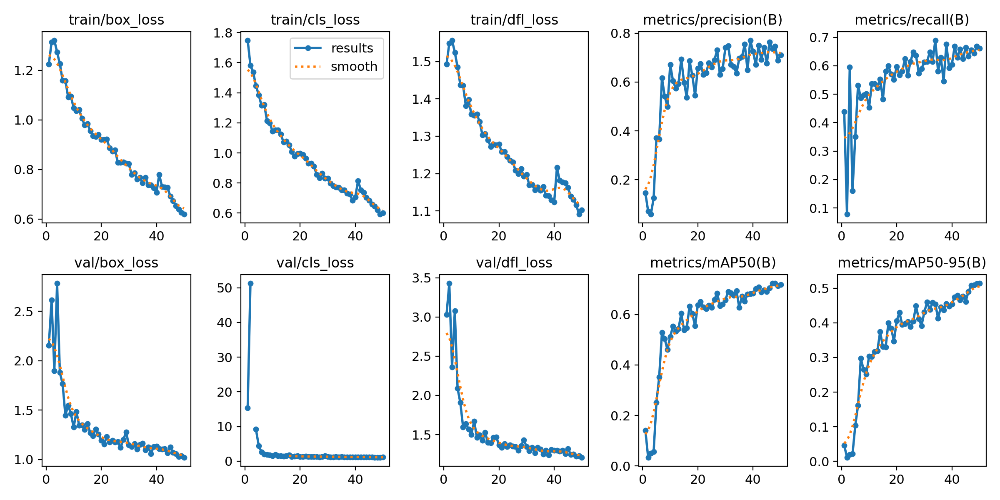

In [ ]:
from IPython.display import Image, display

Image(filename=f'{resultData}/results.png')

In [ ]:
import pandas as pd
df =pd.read_csv(f'{resultData}/results.csv') #df = dataframe
print (df.tail(1))

    epoch     time  train/box_loss  train/cls_loss  train/dfl_loss  \
49     50  1926.16         0.61963         0.60152         1.10262   

    metrics/precision(B)  metrics/recall(B)  metrics/mAP50(B)  \
49               0.71154            0.66181           0.71899   

    metrics/mAP50-95(B)  val/box_loss  val/cls_loss  val/dfl_loss   lr/pg0  \
49              0.51387       1.02055       1.14568       1.21005  0.00006   

     lr/pg1   lr/pg2  
49  0.00006  0.00006  


In [ ]:
!yolo task=detect mode=val model={"/content/runs/detect/train/weights/best.pt"} data={"/content/drive/MyDrive/vegetation_segmentation/data.yaml"}

Ultralytics 8.3.203 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 92 layers, 25,840,339 parameters, 0 gradients, 78.7 GFLOPs
val: Fast image access ✅ (ping: 0.4±0.2 ms, read: 73.8±16.4 MB/s, size: 153.1 KB)
val: Scanning /content/drive/MyDrive/vegetation_segmentation/valid/labels.cache... 83 images, 10 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 83/83 1.1Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 6/6 1.3it/s 4.6s
                   all         83        205      0.706      0.657      0.711      0.513
Speed: 7.9ms preprocess, 21.1ms inference, 0.0ms loss, 10.3ms postprocess per image
Results saved to /content/runs/detect/val
💡 Learn more at https://docs.ultralytics.com/modes/val


In [ ]:
!yolo task=detect mode=predict model={"/content/runs/detect/train/weights/best.pt"} conf=.25 source="{ROOT_DIR}/test/images"

Ultralytics 8.3.203 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 92 layers, 25,840,339 parameters, 0 gradients, 78.7 GFLOPs

image 1/40 /content/drive/My Drive/vegetation_segmentation/test/images/0-0-32_png.rf.0bd2c3beb0b6e72afb744be39011a4b2.jpg: 640x640 3 vegetations, 37.0ms
image 2/40 /content/drive/My Drive/vegetation_segmentation/test/images/0-1-14_png.rf.571ebae03cd52ceac7ac1beee7c4e52e.jpg: 640x640 3 vegetations, 37.8ms
image 3/40 /content/drive/My Drive/vegetation_segmentation/test/images/0-1-4_png.rf.52706a8121e702d22fe4b744ad603a5e.jpg: 640x640 (no detections), 36.9ms
image 4/40 /content/drive/My Drive/vegetation_segmentation/test/images/0-13-15_png.rf.a87017e74e06c80c5cb466c08da01027.jpg: 640x640 3 vegetations, 37.0ms
image 5/40 /content/drive/My Drive/vegetation_segmentation/test/images/0-13-37_png.rf.24fecf374abb8e9bf3c69fcd642b4814.jpg: 640x640 1 vegetation, 37.0ms
image 6/40 /content/drive/My Drive/vegetation_segmentation/test/ima

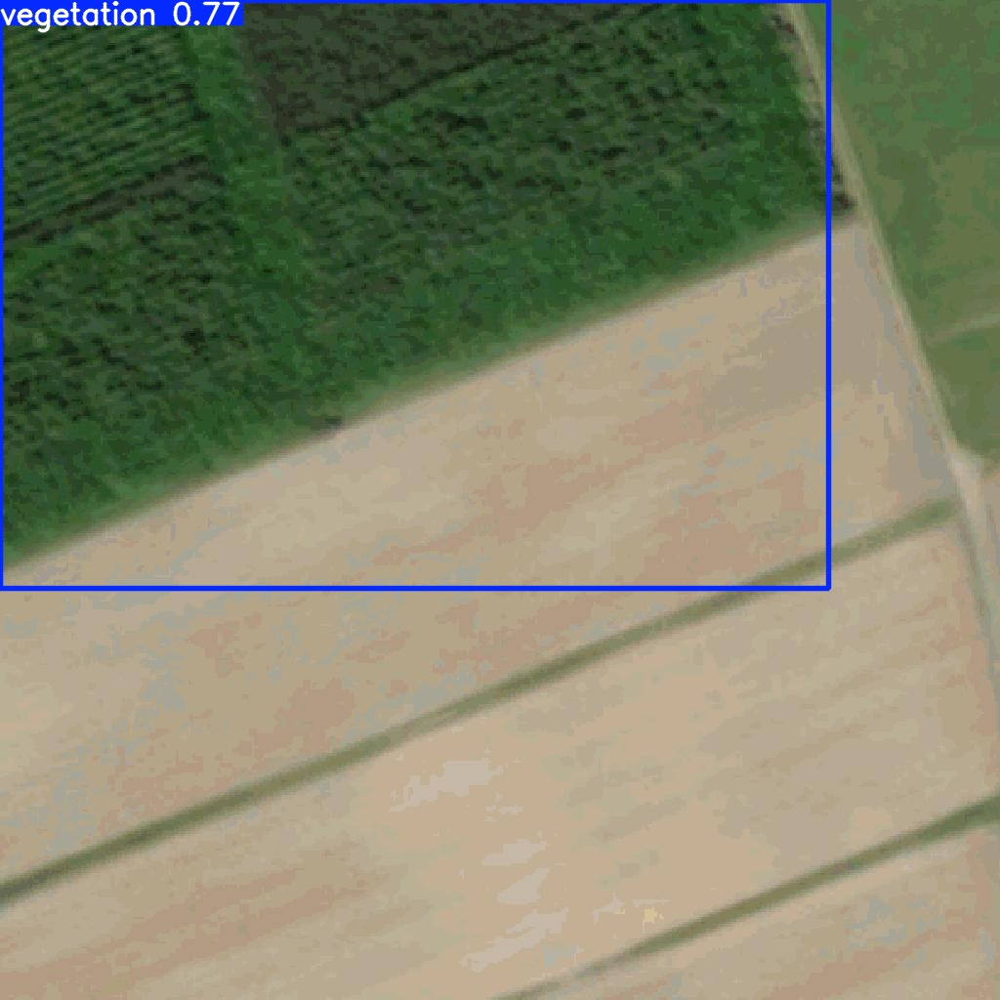

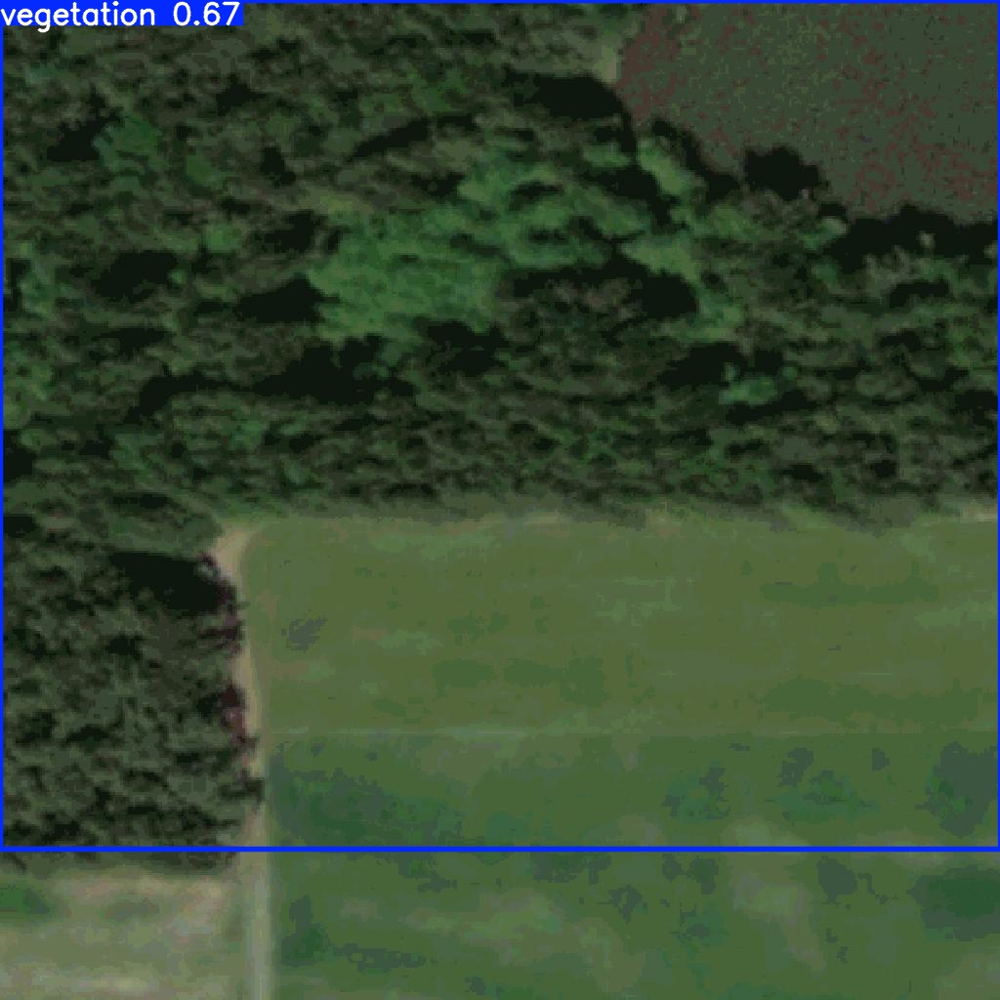

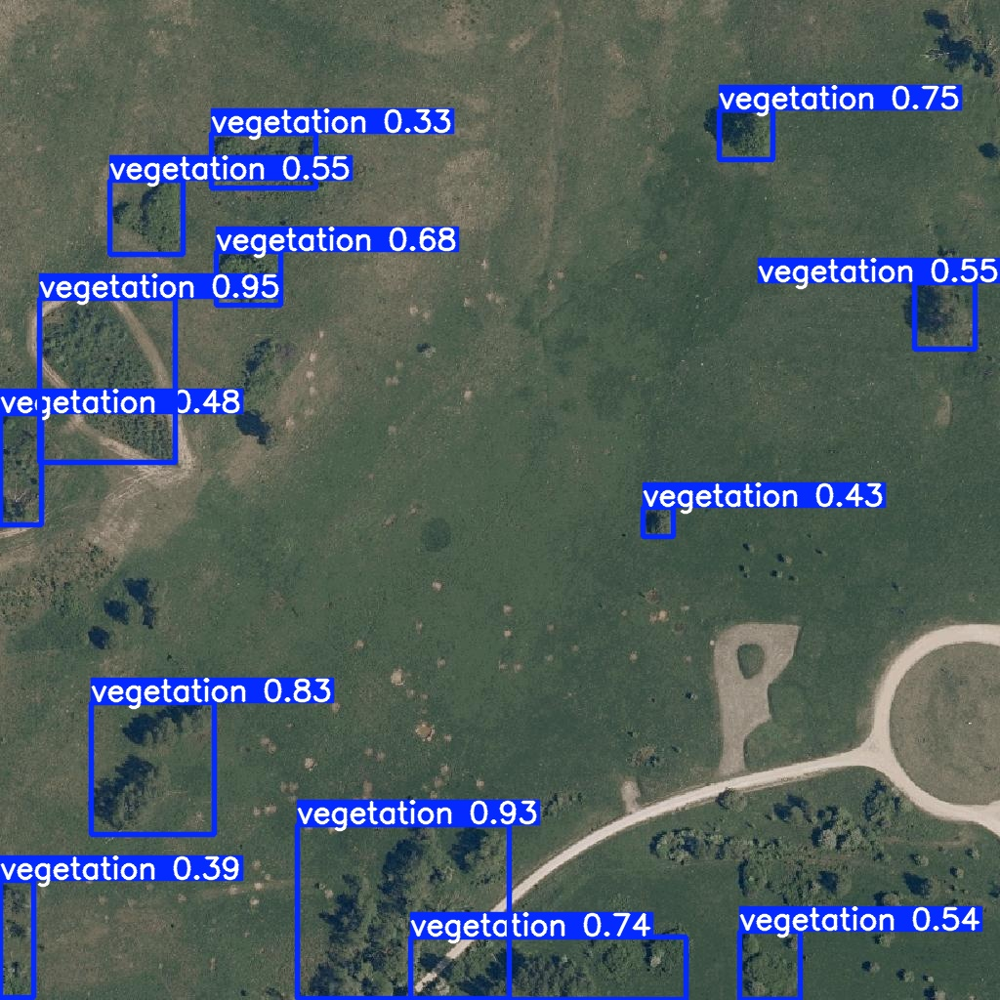

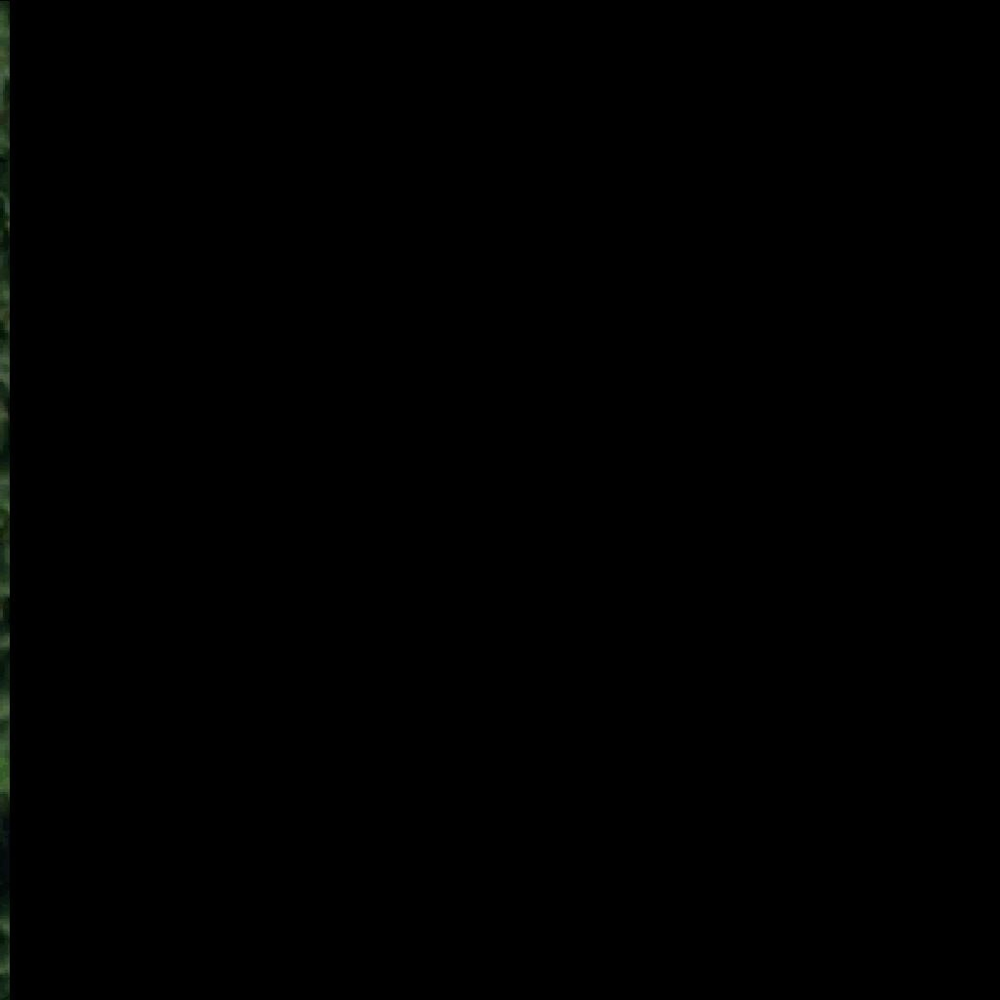

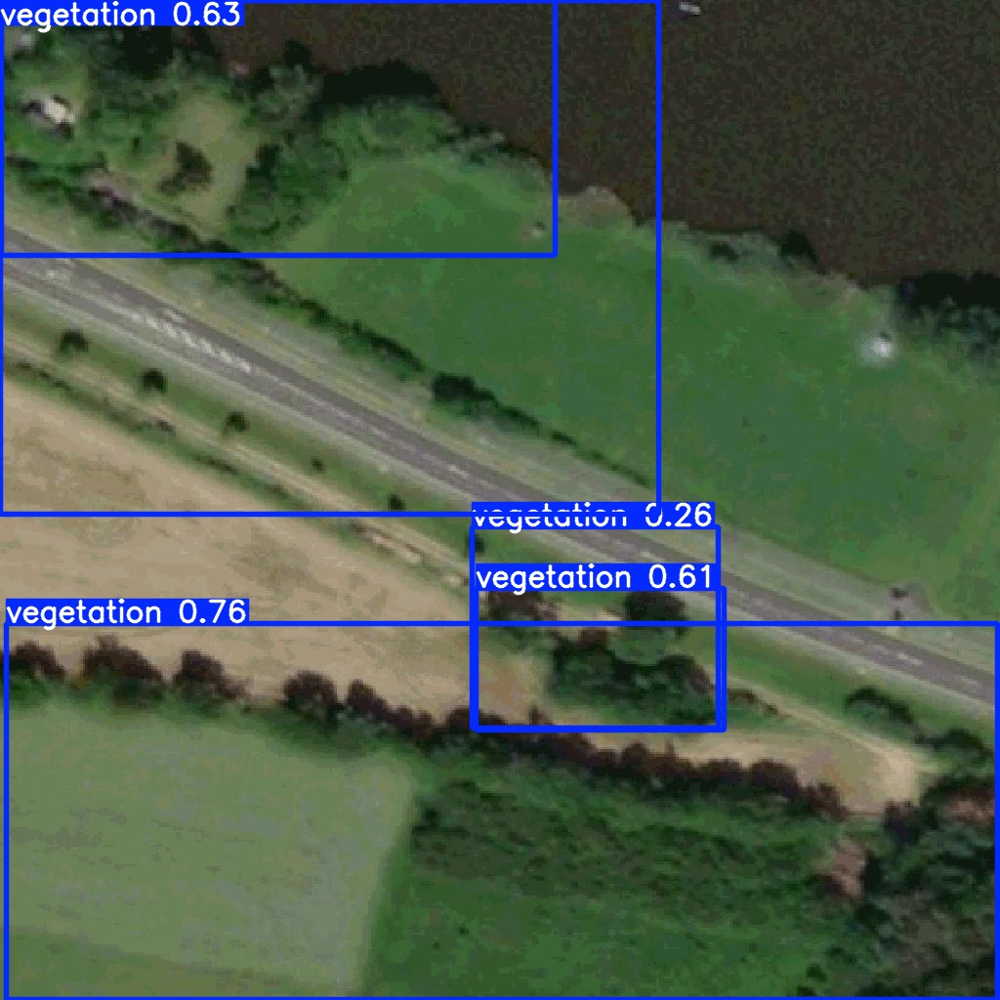

...

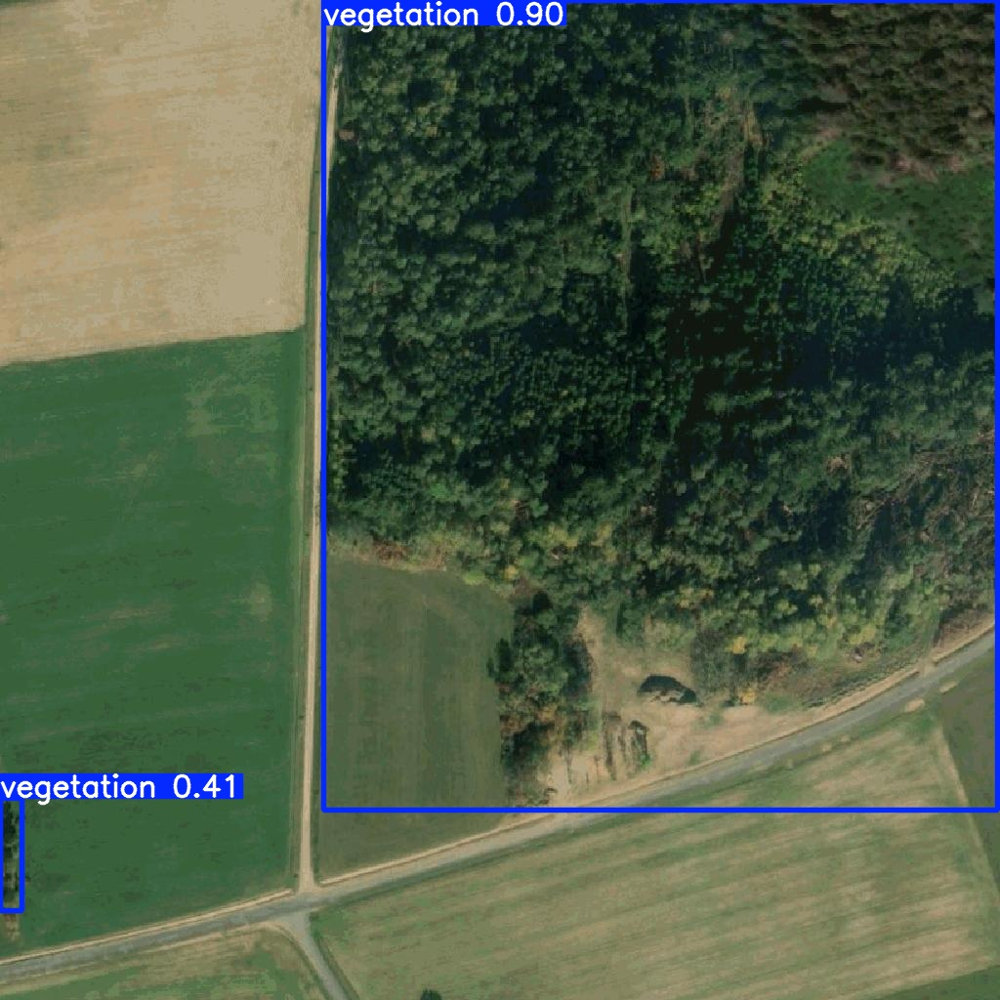

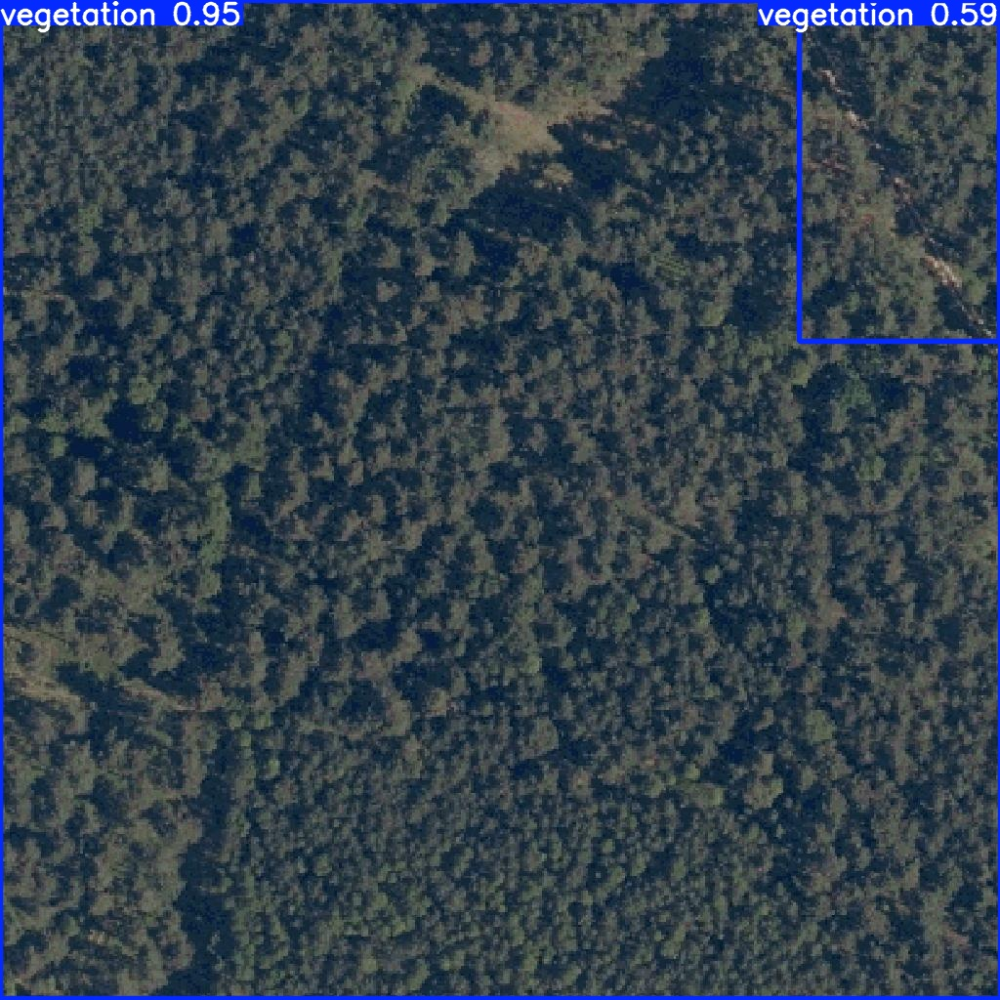

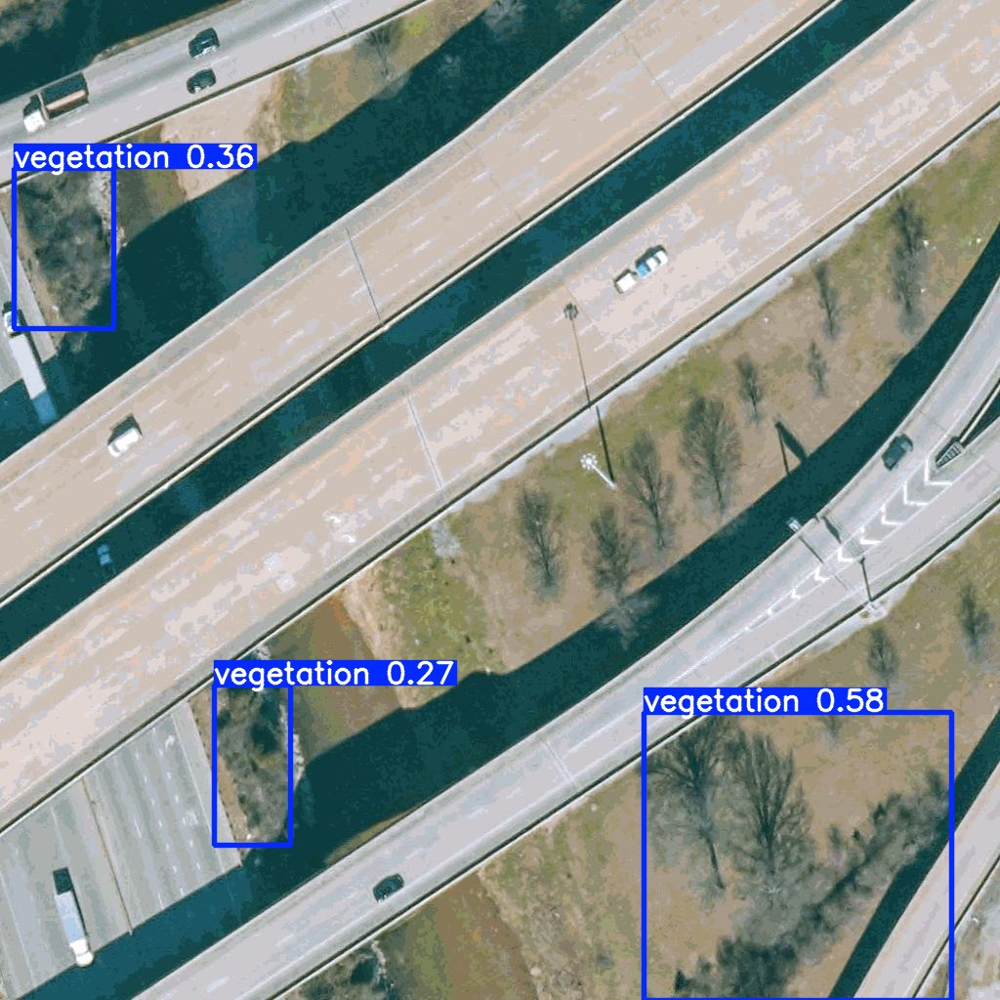

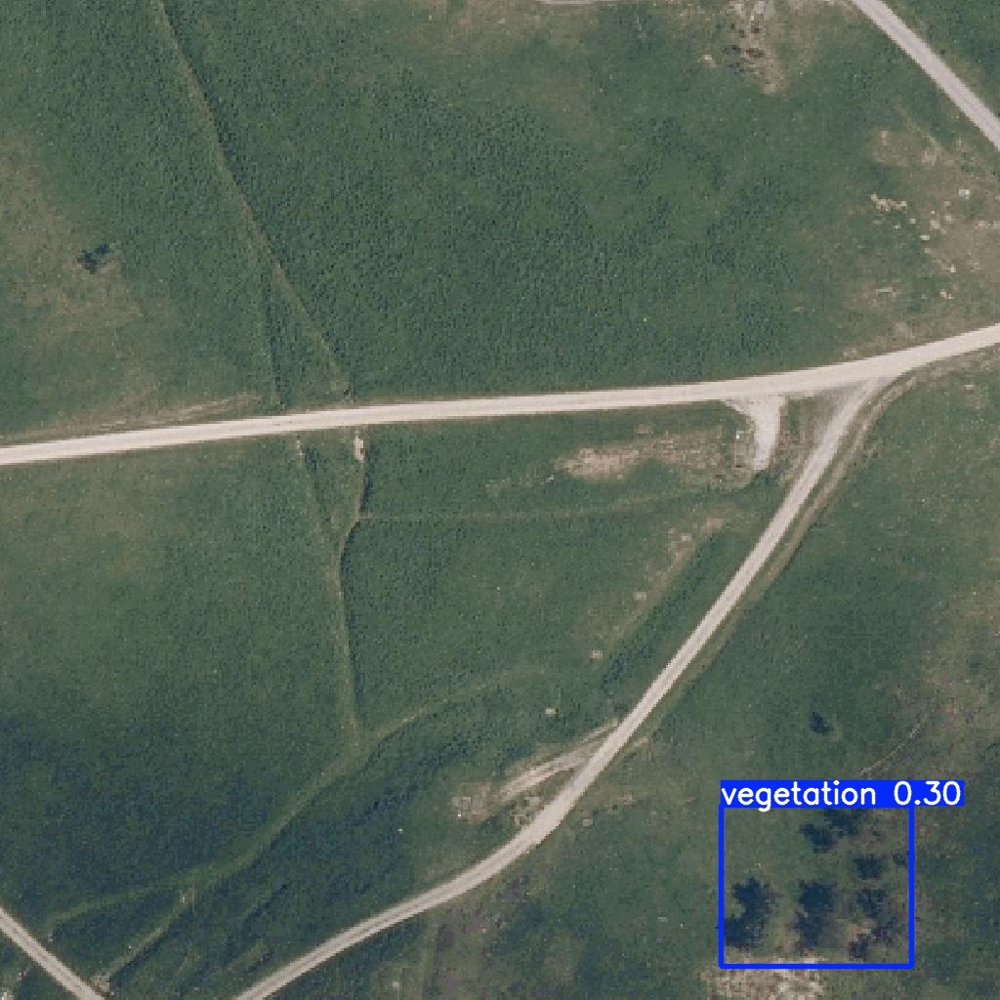

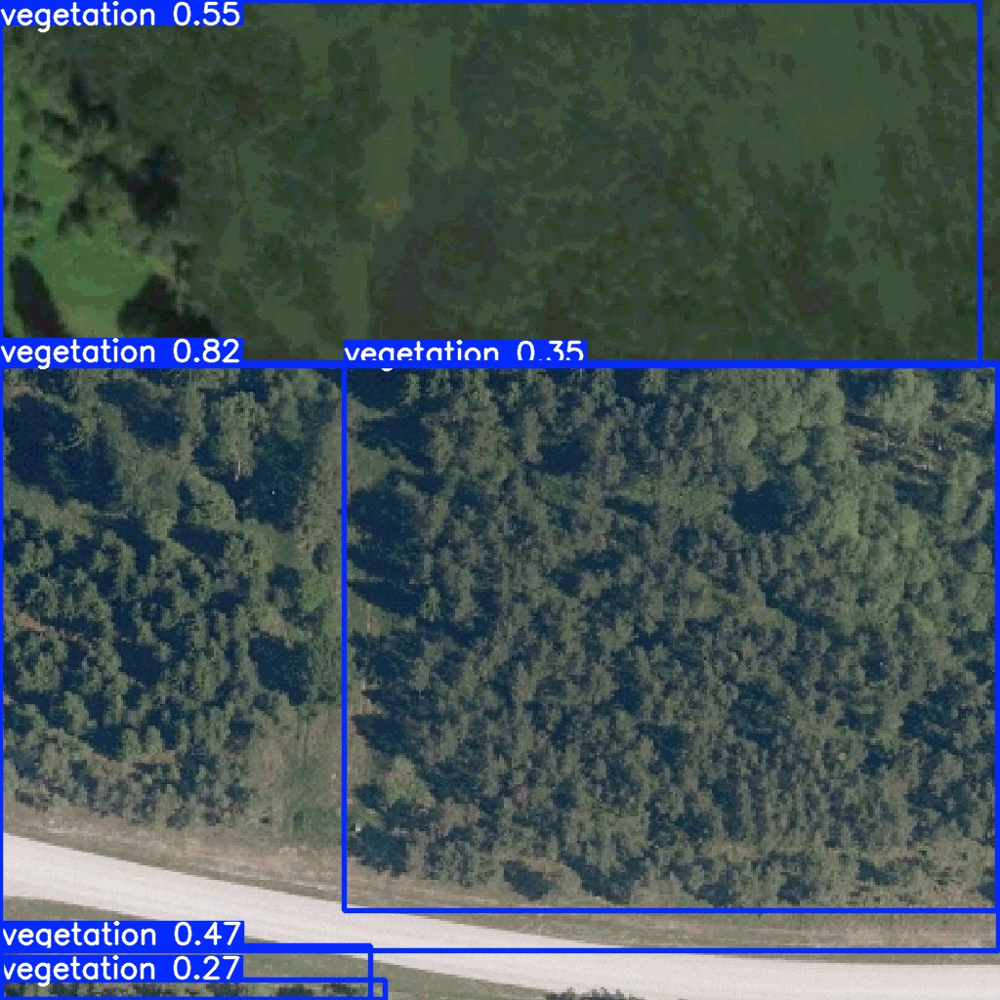

In [ ]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'/content/runs/detect/predict/*.jpg'):
  display(Image(filename=image_path, height=600))
  print'

In [ ]:
%pwd

'/content'

In [ ]:
!mkdir ManualTestingData

In [ ]:
import os
os.chdir("/content/ManualTestingData")

In [ ]:
URL = "https://drive.google.com/file/d/1HxN-_910PZ6xwE8pIm_uH3qg-32F25aW/view?usp=sharing"
id = '1HxN-_910PZ6xwE8pIm_uH3qg-32F25aW'

!wget --no-check-certificate 'https://docs.google.com/uc?export=download&=1HxN-_910PZ6xwE8pIm_uH3qg-32F25aW' -0 inputimage.jpeg


wget: invalid option -- '0'
Usage: wget [OPTION]... [URL]...

Try `wget --help' for more options.


In [ ]:
!yolo task=detect mode=predict model={"/content/runs/detect/train2/weights/best.pt"} conf=.25 source={ROOT_DIR}/test/images